This code is inspired/heavily borrowed/copied  with minor edits from:https://www.kaggle.com/code/konradszafer/paddy-disease-pytorch-acc-98-0  and https://pytorch.org/tutorials/beginner/finetuning_torchvision_models_tutorial.html
All credits to the orginal authors


In [3]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sb
import cv2
from torch.utils.data import Dataset, DataLoader
import io
import os
from PIL import Image

In [4]:
from __future__ import print_function
from __future__ import division
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
print("PyTorch Version: ",torch.__version__)
print("Torchvision Version: ",torchvision.__version__)

PyTorch Version:  2.3.0+cu121
Torchvision Version:  0.18.0+cu121


In [5]:
train_dir='./paddy-disease-classification/train_images'
test_dir='./paddy-disease-classification/test_images'

In [6]:
train_data_path = './paddy-disease-classification/train.csv'
train_data = pd.read_csv(train_data_path)

train_data.head(5)

,image_id,label,variety,age
0,100330.jpg,bacterial_leaf_blight,ADT45,45
1,100365.jpg,bacterial_leaf_blight,ADT45,45
2,100382.jpg,bacterial_leaf_blight,ADT45,45
3,100632.jpg,bacterial_leaf_blight,ADT45,45
4,101918.jpg,bacterial_leaf_blight,ADT45,45


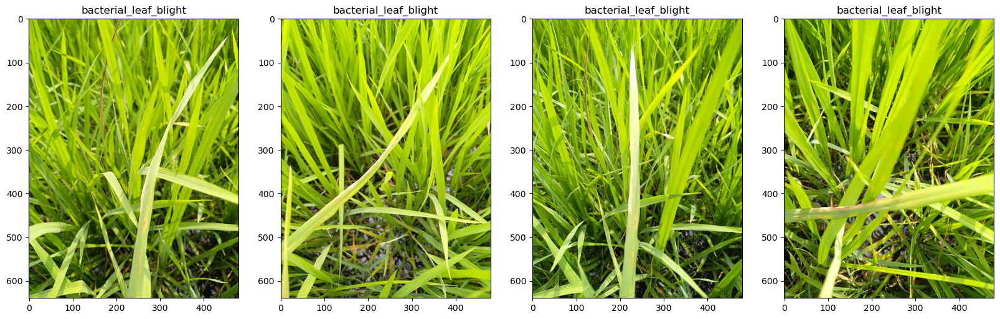

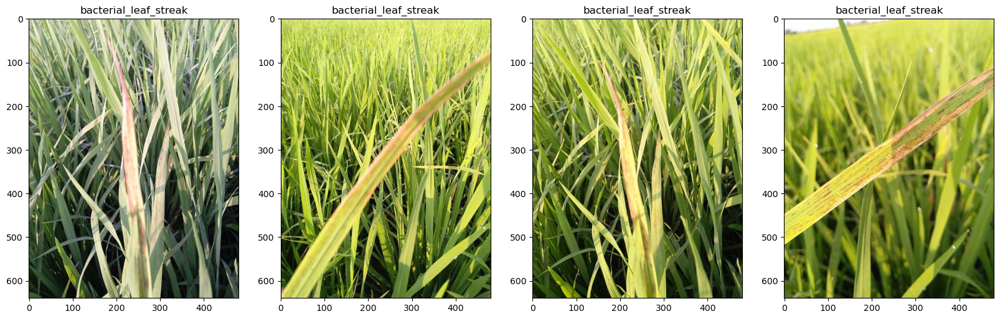

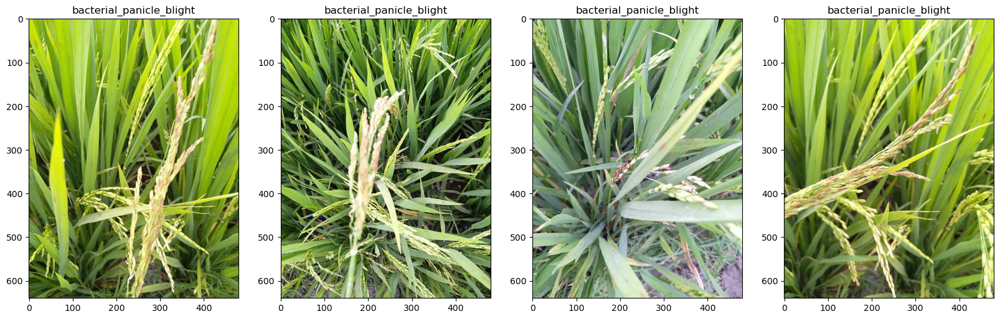

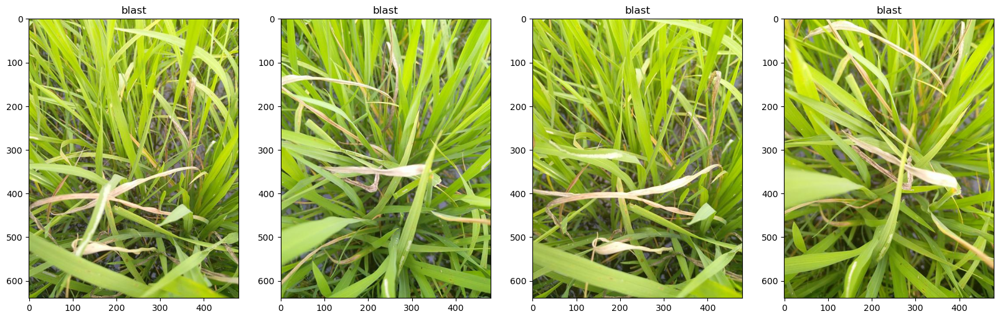

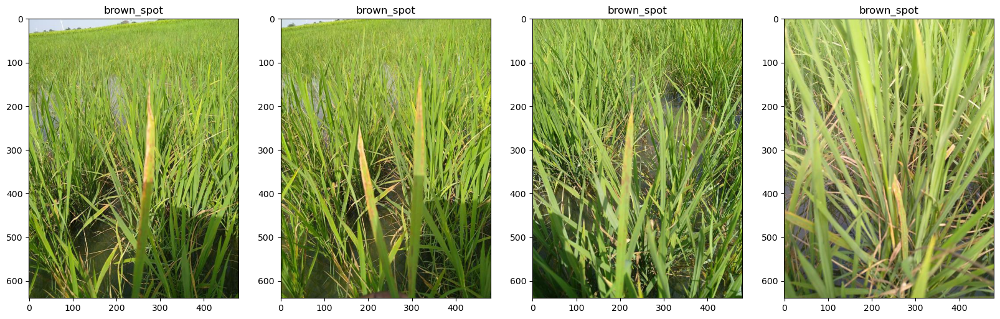

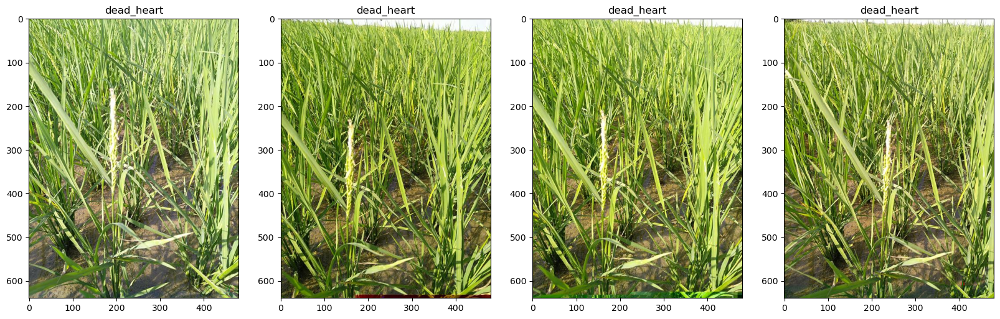

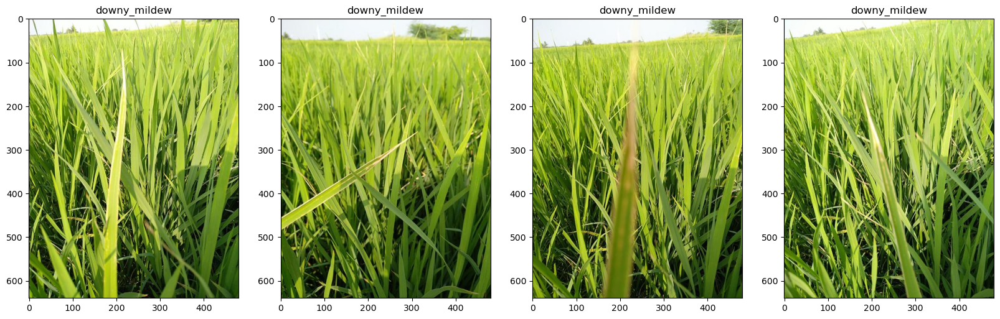

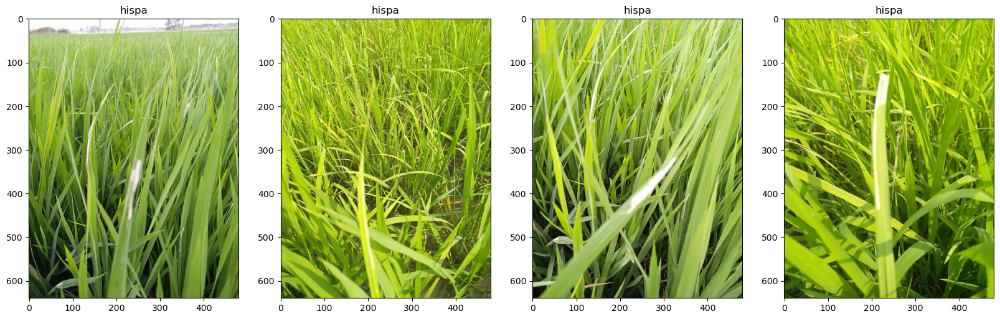

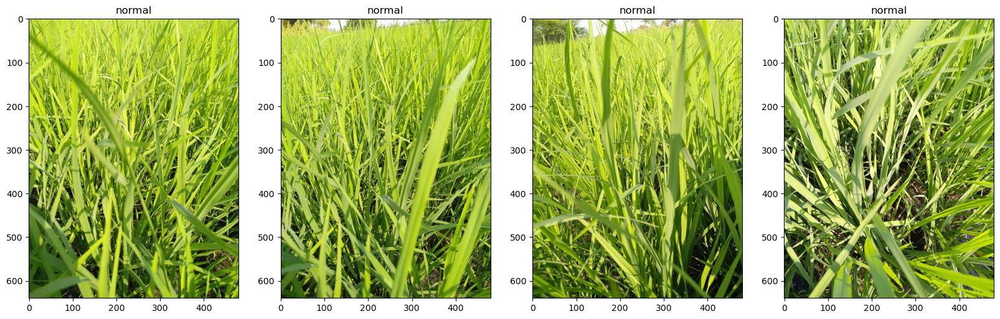

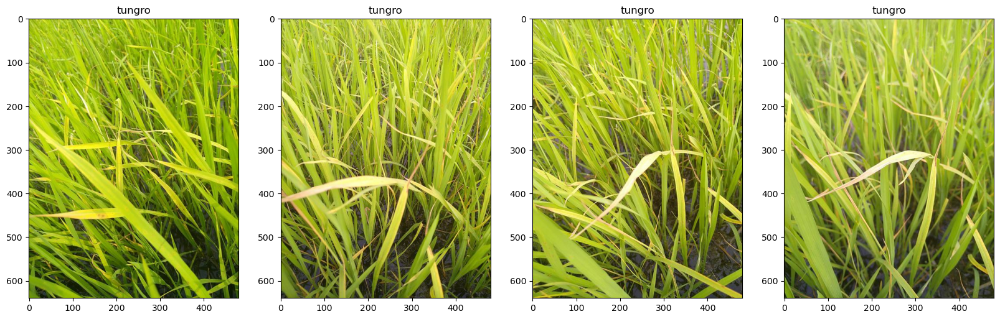

In [7]:
n_cols = 4
disease_groups = train_data.groupby("label")
row_count=1
for name,disease_group in disease_groups:
    index =0
    plot_index = 1
    plt.figure(figsize=(20,120))
    for row_index,row in disease_group.iterrows():
        img_path = os.path.join(train_dir,row.label, row.image_id)
        img = cv2.imread(img_path)
        plt.subplot(4,4,  plot_index)
        plot_index += 1
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"{row.label}")
        index += 1
        if index == 4:
            break
    row_count += 1
    plt.show()


In [8]:
labelArr = train_data['label'].unique()

label2id = {}
id2label = {}
index = 0
for  class_name in labelArr:
    label2id[class_name] = str(index)
    id2label[str(index)] = class_name
    index=index +1
print(label2id)

{'bacterial_leaf_blight': '0', 'bacterial_leaf_streak': '1', 'bacterial_panicle_blight': '2', 'blast': '3', 'brown_spot': '4', 'dead_heart': '5', 'downy_mildew': '6', 'hispa': '7', 'normal': '8', 'tungro': '9'}


In [9]:
# Models to choose from [resnet, alexnet, vgg, squeezenet, densenet, inception]
model_name = "resnet"

# Number of classes in the dataset
num_classes = 10

# Batch size for training (change depending on how much memory you have)
batch_size = 128

# Number of epochs to train for
num_epochs = 100

# Flag for feature extracting. When False, we finetune the whole model,
#   when True we only update the reshaped layer params
feature_extract = False

In [10]:
from sklearn.model_selection import train_test_split

train, valid = train_test_split(train_data, test_size=0.05,random_state=0)
print(len(train))
print(len(valid))

9886
521


In [11]:
train['label'].value_counts()

label
normal                      1683
blast                       1651
hispa                       1498
dead_heart                  1370
tungro                      1036
brown_spot                   913
downy_mildew                 586
bacterial_leaf_blight        463
bacterial_leaf_streak        363
bacterial_panicle_blight     323
Name: count, dtype: int64

In [12]:
class PaddyDataset(Dataset):

    def __init__(self, dataframe, root_dir,is_train, transform=None):
        self.dataframe = dataframe
        self.root_dir = root_dir
        self.transform = transform
        self.is_train = is_train

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = os.path.join(self.root_dir,self.dataframe.iloc[idx, 1],
                                self.dataframe.iloc[idx, 0])
        image1 = cv2.imread(img_name)
        image = Image.fromarray(image1)
        if self.is_train:
            labelKey = self.dataframe.iloc[idx, 1]
            label = torch.tensor(int(label2id[labelKey]))

        else:
            label =torch.tensor(1)

        if self.transform:
            image = self.transform(image)

        return image,label

In [13]:
input_size =224
transform_train = transforms.Compose([
        transforms.RandomVerticalFlip(0.7),
        transforms.RandomHorizontalFlip(0.8),
        transforms.RandomRotation(60),
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
transform_valid =      transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

In [14]:
train_dataset = PaddyDataset( train,root_dir='./paddy-disease-classification/train_images', is_train=True, transform=transform_train)
valid_dataset = PaddyDataset( valid,root_dir='./paddy-disease-classification/train_images', is_train=True, transform=transform_valid)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, num_workers=0, shuffle=True) # Windows 環境下
val_loader =torch.utils.data.DataLoader(valid_dataset, batch_size=batch_size, num_workers=0) # Windows 環境下
dataloaders_dict ={}
dataloaders_dict['train']= train_loader
dataloaders_dict['val'] = val_loader

In [15]:
'''
def mean_std(loader):
  images, labels = next(iter(loader))
  # shape of images = [b,c,w,h]
  mean, std = images.mean([0,2,3]), images.std([0,2,3])
  return mean, std

mean, std = mean_std(dataloaders_dict['train'])
print("mean and std: \n", mean, std)
'''

'\ndef mean_std(loader):\n  images, labels = next(iter(loader))\n  # shape of images = [b,c,w,h]\n  mean, std = images.mean([0,2,3]), images.std([0,2,3])\n  return mean, std\n\nmean, std = mean_std(dataloaders_dict[\'train\'])\nprint("mean and std: \n", mean, std)\n'

Feature batch shape: torch.Size([16, 3, 224, 224])
Labels batch shape: torch.Size([16])


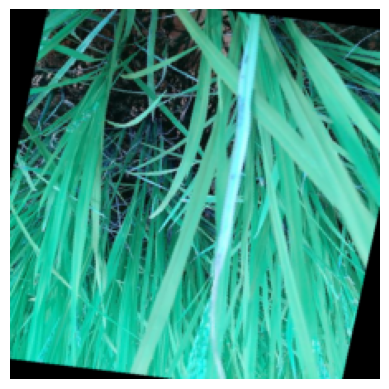

Label: 0


In [16]:
# 減少負擔的 train_loader
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=0)

# 抓出一批
train_features, train_labels = next(iter(train_loader))

# 印出尺寸
print(f"Feature batch shape: {train_features.size()}")
print(f"Labels batch shape: {train_labels.size()}")

# 圖片轉換為 (H, W, C) 並 numpy
img = train_features[1].permute(1, 2, 0).numpy()

# 反標準化（如果你之前有 Normalize）
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
img = std * img + mean
img = np.clip(img, 0, 1)

# 顯示圖片
plt.imshow(img)
plt.axis('off')
plt.show()

# 顯示標籤
print(f"Label: {train_labels[1]}")


In [17]:
import time
import copy
import torch

def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, is_inception=False):
    since = time.time()

    val_acc_history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    print("目前使用的裝置：", device)

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    if is_inception and phase == 'train':
                        outputs, aux_outputs = model(inputs)
                        loss1 = criterion(outputs, labels)
                        loss2 = criterion(aux_outputs, labels)
                        loss = loss1 + 0.4 * loss2
                    else:
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                    _, preds = torch.max(outputs, 1)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            if phase == 'val':
                val_acc_history.append(epoch_acc.item())
                if epoch_acc > best_acc:
                    best_acc = epoch_acc
                    best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('✅ 訓練完成： {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('🏆 最佳驗證準確率： {:.4f}'.format(best_acc))

    model.load_state_dict(best_model_wts)
    return model, val_acc_history


In [18]:
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

In [19]:
def initialize_model(model_name, num_classes, feature_extract, use_pretrained=True):
    # Initialize these variables which will be set in this if statement. Each of these
    #   variables is model specific.
    model_ft = None
    input_size = 0

    if model_name == "resnet":
        """ Resnet18
        """
        #models.resnet.model_urls["resnet50"] = "https://download.pytorch.org/models/resnet50-11ad3fa6.pth"
        model_ft = models.resnet18(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features

        model_ft.fc =  nn.Sequential(nn.Dropout(0.1),
                                     nn.Linear(num_ftrs, num_classes)
                                    )
        input_size = 224

    elif model_name == "alexnet":
        """ Alexnet
        """
        model_ft = models.alexnet(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)
        input_size = 224

    elif model_name == "vgg":
        """ VGG11_bn
        """
        model_ft = models.vgg11_bn(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] =  nn.Sequential(nn.Dropout(0.1),
                                     nn.Linear(num_ftrs, num_classes)
                                    )
        input_size = 224

    elif model_name == "squeezenet":
        """ Squeezenet
        """
        model_ft = models.squeezenet1_0(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        model_ft.classifier[1] = nn.Conv2d(512, num_classes, kernel_size=(1,1), stride=(1,1))
        model_ft.num_classes = num_classes

        input_size = 224

    elif model_name == "densenet":
        """ Densenet
        """
        model_ft = models.densenet121(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier.in_features
        model_ft.classifier = nn.Linear(num_ftrs, num_classes)
        input_size = 224

    elif model_name == "inception":
        """ Inception v3
        Be careful, expects (299,299) sized images and has auxiliary output
        """
        model_ft = models.inception_v3(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        # Handle the auxilary net
        num_ftrs = model_ft.AuxLogits.fc.in_features
        model_ft.AuxLogits.fc = nn.Linear(num_ftrs, num_classes)
        # Handle the primary net
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs,num_classes)
        input_size = 299


    else:
        print("Invalid model name, exiting...")
        exit()

    return model_ft, input_size

# Initialize the model for this run
model_ft, input_size = initialize_model(model_name, num_classes, feature_extract, use_pretrained=True)

# Print the model we just instantiated
print(model_ft)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

c:\Users\User\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\User\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [20]:
# Send the model to GPU
torch.manual_seed(1)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
if device == 'cuda':
    torch.backends.cudnn.benchmark = True
print(f'using {device} device')
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_ft = model_ft.to(device)

# Gather the parameters to be optimized/updated in this run. If we are
#  finetuning we will be updating all parameters. However, if we are
#  doing feature extract method, we will only update the parameters
#  that we have just initialized, i.e. the parameters with requires_grad
#  is True.
params_to_update = model_ft.parameters()
print("Params to learn:")
if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(params_to_update, lr=2e-3, momentum=0.9,weight_decay=1e-6, nesterov=True)
#optimizer_ft = optim.Adam(params_to_update, lr=1e-3)

using cuda device
Params to learn:
	 conv1.weight
	 bn1.weight
	 bn1.bias
	 layer1.0.conv1.weight
	 layer1.0.bn1.weight
	 layer1.0.bn1.bias
	 layer1.0.conv2.weight
	 layer1.0.bn2.weight
	 layer1.0.bn2.bias
	 layer1.1.conv1.weight
	 layer1.1.bn1.weight
	 layer1.1.bn1.bias
	 layer1.1.conv2.weight
	 layer1.1.bn2.weight
	 layer1.1.bn2.bias
	 layer2.0.conv1.weight
	 layer2.0.bn1.weight
	 layer2.0.bn1.bias
	 layer2.0.conv2.weight
	 layer2.0.bn2.weight
	 layer2.0.bn2.bias
	 layer2.0.downsample.0.weight
	 layer2.0.downsample.1.weight
	 layer2.0.downsample.1.bias
	 layer2.1.conv1.weight
	 layer2.1.bn1.weight
	 layer2.1.bn1.bias
	 layer2.1.conv2.weight
	 layer2.1.bn2.weight
	 layer2.1.bn2.bias
	 layer3.0.conv1.weight
	 layer3.0.bn1.weight
	 layer3.0.bn1.bias
	 layer3.0.conv2.weight
	 layer3.0.bn2.weight
	 layer3.0.bn2.bias
	 layer3.0.downsample.0.weight
	 layer3.0.downsample.1.weight
	 layer3.0.downsample.1.bias
	 layer3.1.conv1.weight
	 layer3.1.bn1.weight
	 layer3.1.bn1.bias
	 layer3.1.conv2.w

In [21]:
# Setup the loss fxn
criterion = nn.CrossEntropyLoss()

# Train and evaluate
model_ft, hist = train_model(model_ft, dataloaders_dict, criterion, optimizer_ft, num_epochs=num_epochs, is_inception=(model_name=="inception"))

目前使用的裝置： cuda
Epoch 0/99
----------
train Loss: 1.8232 Acc: 0.3730
val Loss: 1.4481 Acc: 0.4837

Epoch 1/99
----------
train Loss: 1.1391 Acc: 0.6188
val Loss: 1.0339 Acc: 0.6430

Epoch 2/99
----------
train Loss: 0.8121 Acc: 0.7384
val Loss: 0.8086 Acc: 0.7409

Epoch 3/99
----------
train Loss: 0.6388 Acc: 0.7915
val Loss: 0.6673 Acc: 0.7927

Epoch 4/99
----------
train Loss: 0.5204 Acc: 0.8314
val Loss: 0.5688 Acc: 0.8177

Epoch 5/99
----------
train Loss: 0.4385 Acc: 0.8598
val Loss: 0.5746 Acc: 0.8196

Epoch 6/99
----------
train Loss: 0.3727 Acc: 0.8802
val Loss: 0.4931 Acc: 0.8445

Epoch 7/99
----------
train Loss: 0.3234 Acc: 0.8981
val Loss: 0.4745 Acc: 0.8349

Epoch 8/99
----------
train Loss: 0.2875 Acc: 0.9101
val Loss: 0.3779 Acc: 0.8810

Epoch 9/99
----------
train Loss: 0.2500 Acc: 0.9220
val Loss: 0.3683 Acc: 0.8868

Epoch 10/99
----------
train Loss: 0.2259 Acc: 0.9264
val Loss: 0.3306 Acc: 0.8925

Epoch 11/99
----------
train Loss: 0.1951 Acc: 0.9389
val Loss: 0.3148 A

In [22]:
folder = './paddy-disease-classification/test_images'
if not os.path.exists(folder):
        os.makedirs(folder)

test_dataframe = pd.DataFrame(enumerate(sorted(os.listdir(test_dir))))

test_dataframe.head()

,0,1
0,0,200001.jpg
1,1,200002.jpg
2,2,200003.jpg
3,3,200004.jpg
4,4,200005.jpg


In [23]:
class PaddyTestDataset(Dataset):

    def __init__(self, dataframe, root_dir, transform=None):
        self.dataframe = dataframe
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = os.path.join(self.root_dir,
                                self.dataframe.iloc[idx, 1])
        image1 = cv2.imread(img_name)
        image = Image.fromarray(image1)

        label =torch.tensor(1)

        if self.transform:
            image = self.transform(image)

        return image,self.dataframe.iloc[idx, 1]


In [24]:
test_dataset = PaddyTestDataset( test_dataframe,root_dir='./paddy-disease-classification/test_images', transform=transform_valid)

In [25]:
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=16, num_workers=0)

In [26]:
from tqdm import tqdm

model_ft.eval()
filenames = []
finalpredictions = []

for inputs, files in tqdm(test_loader):
    inputs = inputs.to(device)
    outputs = model_ft(inputs)
    _, preds = torch.max(outputs, 1)
    for file in files:
        filenames.append(file)
    for pred in preds:
        finalpredictions.append(id2label[str(pred.item())])


100%|██████████| 217/217 [00:43<00:00,  5.01it/s]


In [27]:
df_preds = pd.DataFrame({'image_id': filenames, "label": finalpredictions})
df_preds.head()

,image_id,label
0,200001.jpg,hispa
1,200002.jpg,normal
2,200003.jpg,blast
3,200004.jpg,blast
4,200005.jpg,blast


In [28]:
test_df = pd.read_csv("./paddy-disease-classification/sample_submission.csv")

submission_df = pd.merge(test_df[['image_id']], df_preds, how='inner', on='image_id')

submission_df.to_csv("submission.csv", index = False)

submission_df.head()


,image_id,label
0,200001.jpg,hispa
1,200002.jpg,normal
2,200003.jpg,blast
3,200004.jpg,blast
4,200005.jpg,blast


In [29]:
print(len(submission_df))

3469


In [30]:
torch.save(model_ft,"PaddyDoctorResnet.pt")